<a href="https://colab.research.google.com/github/IkapuspitaD/sakura-rabbit-detection/blob/main/sakura_rabbit_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Lab DL 05: CNN untuk Deteksi Objek
Nama Kelompok :

# **1. Pendahuluan**

## **Klasifikasi Citra vs Deteksi Objek**

**Klasifikasi Citra:** 
*   Bertujuan mengetahui apa yang ada di dalam citra tersebut.
*   Batasan: Objek mayoritas ada di dalam citra. Bekerja dengan baik apabila citra hanya memuat satu objek saja. 

**Deteksi Objek:** 
*   Bertujuan mengetahui apa yang ada di dalam citra dan dimana letaknya. 
*   Keuntungan: Dapat mendeteksi multi-objek pada saat yang bersamaan dan dapat mendeteksi objek2 yang kecil. 

![Klasifikasi vs Deteksi Objek](https://i.ibb.co/jZRJsrt/object-detection.jpg)

## **Arsitektur untuk Deteksi Objek:**
### **Region-based CNN**
![rcnn](https://i.ibb.co/KLrzrxG/rcnn.png)*R-CNN*
![fast-rcnn](https://i.ibb.co/mXMWSfZ/fast-rcnn.jpg)*Fast-RCNN*
![faster-rcnn](https://i.ibb.co/YQYqjX4/faster-rcnn.png)*Faster-RCNN*

### **SSD (Single Shot MultiBox Detector)**
![ssd](https://i.ibb.co/4Smq9jb/ssd.png)

### **Mask Region-based CNN (Mask R-CNN)**
![maskrcnn](https://www.researchgate.net/profile/Juan-Tapia-Farias/publication/334998795/figure/fig5/AS:788891527311360@1565097805155/Architecture-of-the-original-Mask-R-CNN-framework-The-CNN-represents-the-backbone-used.ppm)

# **2. Mounting Google Drive**

In [2]:
from google.colab import drive

# mounting dataset dari gdrive
drive.mount('/content/gdrive', force_remount=True)

# lokasi dataset - ubah sesuai dengan lokasi anda mengupload folder datanya
root_path = 'gdrive/My Drive/Colab Notebooks/Deep Learning Labs/RabbitDetection/'

# opsional - tampilkan info lokasi dataset
print("Path root:", root_path)

Mounted at /content/gdrive
Path root: gdrive/My Drive/Colab Notebooks/Deep Learning Labs/RabbitDetection/


# **3. Tensorflow Object Detection API**
Install Object Detection API

## 3.1. Clone dari GITHUB

In [3]:
import os
import pathlib

# ganti current working directory ke gdrive anda
os.chdir(root_path)

# clone tensorflow model ke gdrive anda
if "models" in pathlib.Path.cwd().parts:
    while "models" in pathlib.Path.cwd().parts:
        os.chdir('..')
elif not pathlib.Path('models').exists():
    !git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 3422, done.
remote: Counting objects: 100% (3422/3422), done.
remote: Compressing objects: 100% (2859/2859), done.
remote: Total 3422 (delta 893), reused 1416 (delta 506), pack-reused 0
Receiving objects: 100% (3422/3422), 35.12 MiB | 14.76 MiB/s, done.
Resolving deltas: 100% (893/893), done.
Checking out files: 100% (3100/3100), done.


## 3.2. Install Object Detection API

In [4]:
# install Object Detection API
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing /content/gdrive/MyDrive/Colab Notebooks/Deep Learning Labs/RabbitDetection/models/research
  Created wheel for object-detection: filename=object_detection-0.1-py3-none-any.whl size=1694955 sha256=e65cb46832adfa9860a13eeba3c27012b8d6f8ba8398d5c220aec906f7a2df4d
  Stored in directory: /tmp/pip-ephem-wheel-cache-gy6z2k_v/wheels/96/16/78/19dbdf9ff0d27c6e4852f4e5652c6d37b92b54d8c60819e872
  Created wheel for py-cpuinfo: filename=py_cpuinfo-8.0.0-py3-none-any.whl size=22257 sha256=a076648be09d0c6b35653ca8c4a2b328afc6aceb3d2158ab9f6935a2e479194d
  Stored in directory: /root/.cache/pip/wheels/d2/f1/1f/041add21dc9c4220157f1bd2bd6afe1f1a49524c3396b94401
  Created wheel for dill: filename=dill-0.3.1.1-py3-none-any.whl size=78544 sha256=f5613ca04e5aab52e6013ab331824435cf0c82de61664fe504cd52cfac57cb88
  Stored in directory: /root/.cache/pip/wheels/a4/61/fd/c57e374e580aa78a45ed78d5859b3a4443

  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
multiprocess 0.70.13 requires dill>=0.3.5.1, but you have dill 0.3.1.1 which is incompatible.
gym 0.17.3 requires cloudpickle<1.7.0,>=1.2.0, but you have cloudpickle 2.1.0 which is incompatible.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.28.1 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.
albumentations 0.1.12 requires imgaug<0.2.7,

## 3.3. Import Object Detection Library

In [5]:
import matplotlib
import matplotlib.pyplot as plt

import os
import random
import io
import imageio
import glob
import scipy.misc
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display, Javascript
from IPython.display import Image as IPyImage

import tensorflow as tf

from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import colab_utils
from object_detection.builders import model_builder

%matplotlib inline

# **4. Baca dan Visualisasi Dataset**

## 4.1. Fungsi Baca dan Visualisasi Dataset

In [6]:
# baca dataset lalu resize dan jadikan array
def load_image_into_numpy_array(path):
    img_data = tf.io.gfile.GFile(path, 'rb').read()
    image = Image.open(BytesIO(img_data))
    (im_width, im_height) = image.size
    return np.array(image.getdata()).reshape(
        (im_height, im_width, 3)).astype(np.uint8)

# plot hasil deteksi objek beserta marker dan scorenya
def plot_detections(image_np,
                    boxes,
                    classes,
                    scores,
                    category_index,
                    figsize=(12, 16),
                    image_name=None):
    image_np_with_annotations = image_np.copy()
    viz_utils.visualize_boxes_and_labels_on_image_array(
        image_np_with_annotations,
        boxes,
        classes,
        scores,
        category_index,
        use_normalized_coordinates=True,
        min_score_thresh=0.8)
    if image_name:
        plt.imsave(image_name, image_np_with_annotations)
    else:
        plt.imshow(image_np_with_annotations)

## 4.2 Tampilkan Sampel Data Latih

In [14]:
# baca citra dari data latih dan tampilkan
train_image_dir = 'models/research/object_detection/test_images/rabbit/train/'
train_images_np = []
for i in range(1, 7):
    image_path = os.path.join(train_image_dir, 'kelinci' + str(i) + '.jpg')
    train_images_np.append(load_image_into_numpy_array(image_path))

plt.rcParams['axes.grid'] = False
plt.rcParams['xtick.labelsize'] = False
plt.rcParams['ytick.labelsize'] = False
plt.rcParams['xtick.top'] = False
plt.rcParams['xtick.bottom'] = False
plt.rcParams['ytick.left'] = False
plt.rcParams['ytick.right'] = False
plt.rcParams['figure.figsize'] = [14, 7]

for idx, train_image_np in enumerate(train_images_np):
    plt.subplot(2, 3, idx+1)
    plt.imshow(train_image_np)
plt.show()

NotFoundError: ignored

## 4.3. Buat Anotasi Ground-Truth dari Data Latih

In [ ]:
# buat anotasi manual
gt_boxes = []
colab_utils.annotate(train_images_np, box_storage_pointer=gt_boxes)

# buat anotasi otomatis sesuai koordinat dibawah ini
# gt_boxes = [
#            np.array([[0.436, 0.591, 0.629, 0.712]], dtype=np.float32),
#            np.array([[0.539, 0.583, 0.73, 0.71]], dtype=np.float32),
#            np.array([[0.464, 0.414, 0.626, 0.548]], dtype=np.float32),
#            np.array([[0.313, 0.308, 0.648, 0.526]], dtype=np.float32),
#            np.array([[0.256, 0.444, 0.484, 0.629]], dtype=np.float32)
# ]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

'--boxes array populated--'

<IPython.core.display.Javascript object>

## 4.4 Konversi Data Latih ke Tensor

In [ ]:
# label dari objek (bukan latar belakang) dimulai dari 1, dst
# label background = 0
kelinci_class_id = 1   # label objek 
num_classes = 1     # jumlah kelas objek

# nama kelas objek
category_index = {kelinci_class_id: {'id': kelinci_class_id, 'name': 'kelinci'}}

label_id_offset = 1
train_image_tensors = []
gt_classes_one_hot_tensors = []
gt_box_tensors = []

# untuk setiap data latih dan ground truth bounding box nya
for (train_image_np, gt_box_np) in zip(train_images_np, gt_boxes):
    
    # buat citra menjadi tensor 4D agar bisa masuk ke network
    train_image_tensors.append(tf.expand_dims(tf.convert_to_tensor(
        train_image_np, dtype=tf.float32), axis=0))
    
    # buat ground-truth bounding box menjadi tensor 4D juga
    gt_box_tensors.append(tf.convert_to_tensor(gt_box_np, dtype=tf.float32))

    # geser label kelas objek dengan +1 agar background tetap di label = 0
    zero_indexed_groundtruth_classes = tf.convert_to_tensor(
        np.ones(shape=[gt_box_np.shape[0]], dtype=np.int32) - label_id_offset)
    
    # konversi label kelas ke one-hot encoding
    gt_classes_one_hot_tensors.append(tf.one_hot(
        zero_indexed_groundtruth_classes, num_classes))
print('Done prepping data.')

Done prepping data.


## 4.5. Tampilkan Marker Ground-Truth Data Latih

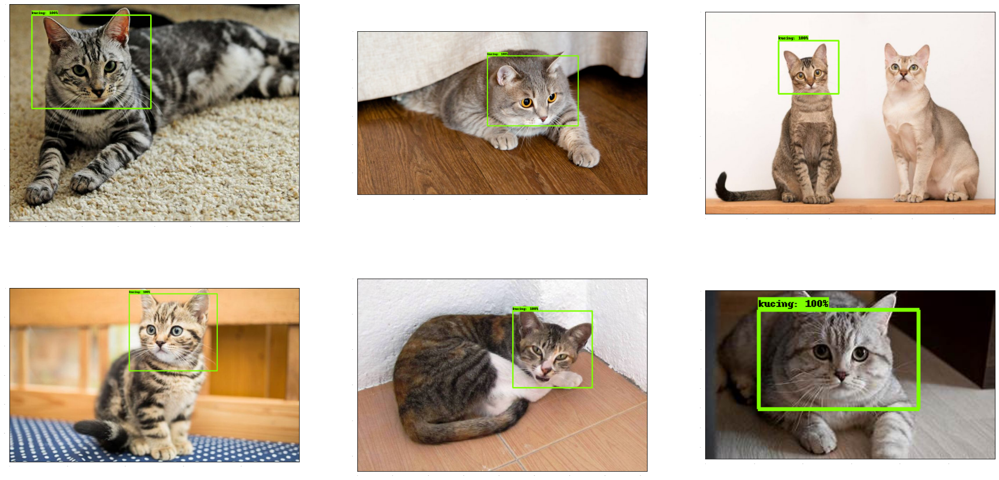

In [ ]:
dummy_scores = np.array([1.0], dtype=np.float32)  # beri skor dummy 100%

# tampilkan dataset beserta marker ground-truth kotak deteksinya
plt.figure(figsize=(30, 15))
for idx in range(6):
    plt.subplot(2, 3, idx+1)
    plot_detections(
        train_images_np[idx],
        gt_boxes[idx],
        np.ones(shape=[gt_boxes[idx].shape[0]], dtype=np.int32),
        dummy_scores, category_index)
plt.show()

# **5. Membangun Model Deteksi Objek**

## 5.1. Mendownload Pre-Trained Model Deteksi Objek

In [ ]:
# Download pre-trained checkpoint dari SSD-ResNet50 FPN pada MS-COCO dataset
# Upload di lokasi models/research/object_detection/test_data/
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz
!tar -xf ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz
!mv ssd_resnet50_v1_fpn_640x640_coco17_tpu-8/checkpoint models/research/object_detection/test_data/

--2022-05-14 12:39:54--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 209.85.147.128, 2607:f8b0:4001:c20::80
Connecting to download.tensorflow.org (download.tensorflow.org)|209.85.147.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 244817203 (233M) [application/x-tar]
Saving to: ‘ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz.4’

ssd_resnet50_v1_fpn 100%[===================>] 233.48M  39.8MB/s    in 5.1s    

2022-05-14 12:39:59 (45.7 MB/s) - ‘ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz.4’ saved [244817203/244817203]

--2022-05-14 12:40:11--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 209.85.147.128, 2607:f8b0:4001:c20::80
Connecting to download.tensorflow.org (download.tensorflow.org)|2

## 5.2. Setup Model

In [ ]:
tf.keras.backend.clear_session()

print('Membangun model dan persiapkan pre-trained bobot untuk fine-tuning...', 
      flush=True)
num_classes = 1
pipeline_config = 'models/research/object_detection/configs/tf2/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.config'
checkpoint_path = 'models/research/object_detection/test_data/checkpoint/ckpt-0'

# network tersebut dilatih menggunakan MS-COCO dataset dengan 90 label kelas
# karena praktikum ini hanya menggunakan 1 kelas objek saja
# maka diubah jumlah kelasnya di configuration
configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']
model_config.ssd.num_classes = num_classes
model_config.ssd.freeze_batchnorm = True
detection_model = model_builder.build(
      model_config=model_config, is_training=True)

# pakai bagian prediksi box dan latih dari awal untuk bagian klasifikasinya
fake_box_predictor = tf.compat.v2.train.Checkpoint(
    _base_tower_layers_for_heads=detection_model._box_predictor._base_tower_layers_for_heads,
    # _prediction_heads=detection_model._box_predictor._prediction_heads,
    #    (i.e., the classification head that we *will not* restore)
    _box_prediction_head=detection_model._box_predictor._box_prediction_head,
    )
fake_model = tf.compat.v2.train.Checkpoint(
          _feature_extractor=detection_model._feature_extractor,
          _box_predictor=fake_box_predictor)
ckpt = tf.compat.v2.train.Checkpoint(model=fake_model)
ckpt.restore(checkpoint_path).expect_partial()

# prediksi ke citra dummy untuk membuat variabel prediksinya
image, shapes = detection_model.preprocess(tf.zeros([1, 640, 640, 3]))
prediction_dict = detection_model.predict(image, shapes)
_ = detection_model.postprocess(prediction_dict, shapes)
print('Weights restored!')

## 5.3. Fungsi Pelatihan

In [ ]:
tf.keras.backend.set_learning_phase(True)

# These parameters can be tuned; since our training set has 5 images
# it doesn't make sense to have a much larger batch size, though we could
# fit more examples in memory if we wanted to.
batch_size = 4
learning_rate = 0.01
num_batches = 100

# Select variables in top layers to fine-tune.
trainable_variables = detection_model.trainable_variables
to_fine_tune = []
prefixes_to_train = [
    'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalBoxHead',
    'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalClassHead']
for var in trainable_variables:
    if any([var.name.startswith(prefix) for prefix in prefixes_to_train]):
        to_fine_tune.append(var)

# Set up forward + backward pass for a single train step.
def get_model_train_step_function(model, optimizer, vars_to_fine_tune):
    """Get a tf.function for training step."""

    # Use tf.function for a bit of speed.
    # Comment out the tf.function decorator if you want the inside of the
    # function to run eagerly.
    @tf.function
    def train_step_fn(image_tensors,
                        groundtruth_boxes_list,
                        groundtruth_classes_list):
        """A single training iteration.

        Args:
        image_tensors: A list of [1, height, width, 3] Tensor of type tf.float32.
            Note that the height and width can vary across images, as they are
            reshaped within this function to be 640x640.
        groundtruth_boxes_list: A list of Tensors of shape [N_i, 4] with type
            tf.float32 representing groundtruth boxes for each image in the batch.
        groundtruth_classes_list: A list of Tensors of shape [N_i, num_classes]
            with type tf.float32 representing groundtruth boxes for each image in
            the batch.

        Returns:
        A scalar tensor representing the total loss for the input batch.
        """
        shapes = tf.constant(batch_size * [[640, 640, 3]], dtype=tf.int32)
        model.provide_groundtruth(
            groundtruth_boxes_list=groundtruth_boxes_list,
            groundtruth_classes_list=groundtruth_classes_list)
        with tf.GradientTape() as tape:
            preprocessed_images = tf.concat(
                [detection_model.preprocess(image_tensor)[0]
                for image_tensor in image_tensors], axis=0)
            prediction_dict = model.predict(preprocessed_images, shapes)
            losses_dict = model.loss(prediction_dict, shapes)
            total_loss = losses_dict['Loss/localization_loss'] + losses_dict['Loss/classification_loss']
            gradients = tape.gradient(total_loss, vars_to_fine_tune)
            optimizer.apply_gradients(zip(gradients, vars_to_fine_tune))
        return total_loss

    return train_step_fn

optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate, momentum=0.9)
train_step_fn = get_model_train_step_function(
    detection_model, optimizer, to_fine_tune)

/usr/local/lib/python3.7/dist-packages/keras/backend.py:450: UserWarning: `tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.
  warnings.warn('`tf.keras.backend.set_learning_phase` is deprecated and '


# **6. Pelatihan Model**

In [ ]:
print('Start fine-tuning!', flush=True)
for idx in range(num_batches):
    # Grab keys for a random subset of examples
    all_keys = list(range(len(train_images_np)))
    random.shuffle(all_keys)
    example_keys = all_keys[:batch_size]

    # Note that we do not do data augmentation in this demo.  If you want a
    # a fun exercise, we recommend experimenting with random horizontal flipping
    # and random cropping :)
    gt_boxes_list = [gt_box_tensors[key] for key in example_keys]
    gt_classes_list = [gt_classes_one_hot_tensors[key] for key in example_keys]
    image_tensors = [train_image_tensors[key] for key in example_keys]

    # Training step (forward pass + backwards pass)
    total_loss = train_step_fn(image_tensors, gt_boxes_list, gt_classes_list)

    if idx % 10 == 0:
        print('batch ' + str(idx) + ' of ' + str(num_batches)
        + ', loss=' +  str(total_loss.numpy()), flush=True)

print('Done fine-tuning!')

Start fine-tuning!
batch 0 of 100, loss=1.719125
batch 10 of 100, loss=0.7305088
batch 20 of 100, loss=0.27443033
batch 40 of 100, loss=0.07345724
batch 50 of 100, loss=0.04062365
batch 60 of 100, loss=0.03254007
batch 70 of 100, loss=0.026405428
batch 80 of 100, loss=0.0316127
batch 90 of 100, loss=0.021477139
Done fine-tuning!


# **7. Evaluasi Model**

In [ ]:
test_image_dir = 'models/research/object_detection/test_images/kucing/test/'
test_images_np = []
for i in range(1, 13):
    image_path = os.path.join(test_image_dir, 'kucing' + str(i) + '.jpg')
    test_images_np.append(np.expand_dims(
        load_image_into_numpy_array(image_path), axis=0))

# Again, uncomment this decorator if you want to run inference eagerly
@tf.function
def detect(input_tensor):
    """Run detection on an input image.

    Args:
        input_tensor: A [1, height, width, 3] Tensor of type tf.float32.
        Note that height and width can be anything since the image will be
        immediately resized according to the needs of the model within this
        function.

    Returns:
        A dict containing 3 Tensors (`detection_boxes`, `detection_classes`,
        and `detection_scores`).
    """
    preprocessed_image, shapes = detection_model.preprocess(input_tensor)
    prediction_dict = detection_model.predict(preprocessed_image, shapes)
    return detection_model.postprocess(prediction_dict, shapes)

# Note that the first frame will trigger tracing of the tf.function, which will
# take some time, after which inference should be fast.

label_id_offset = 1
for i in range(len(test_images_np)):
    input_tensor = tf.convert_to_tensor(test_images_np[i], dtype=tf.float32)
    detections = detect(input_tensor)

    plot_detections(
        test_images_np[i][0],
        detections['detection_boxes'][0].numpy(),
        detections['detection_classes'][0].numpy().astype(np.uint32)
        + label_id_offset,
        detections['detection_scores'][0].numpy(),
        category_index, figsize=(15, 20), image_name="kucing_frame_" + ('%02d' % i) + ".jpg")

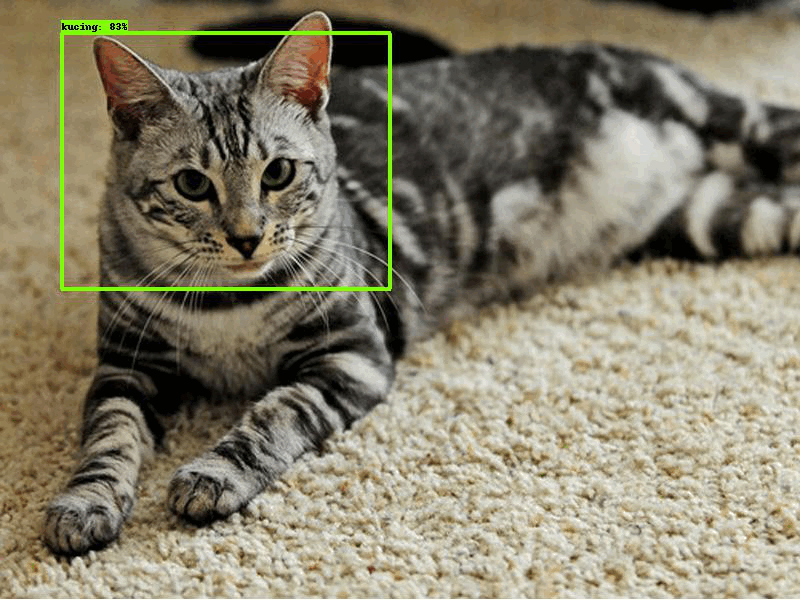

In [ ]:
imageio.plugins.freeimage.download()

anim_file = 'kucing_test.gif'

filenames = glob.glob('gif_frame_*.jpg')
filenames = sorted(filenames)
last = -1
images = []
for filename in filenames:
    image = imageio.imread(filename)
    images.append(image)

imageio.mimsave(anim_file, images, 'GIF-FI', fps=5)

display(IPyImage(open(anim_file, 'rb').read()))

# **8. Post Test**
1. Copy notebook **LabDL_05_Object_Detection_Praktikan.ipynb** dan beri nama **LabDL_05_Object_Detection_Praktikan_Post_Test.ipynb** 
2. Buka notebook tersebut untuk  mengerjakan post-test sehingga anda menjalankan notebook yang berbeda dengan yang di praktikum. 
3. Cek contoh data latih bebek karet di folder gdrive anda di lokasi. 
`LabDL05 Data/models/research/object_detection/test_images/ducky/train/`
4. Cek juga contoh data uji bebek karet di folder gdrive anda di lokasi.
`LabDL05 Data/research/object_detection/test_images/ducky/test/`
5. Cari data latih dan data uji untuk objek yang lain di internet seperti contoh citra bebek karet diatas. Misal objek baru anda adalah kucing maka beri nama setiap citra dengan **kucing1.jpg, kucing2.jpg, dan seterusnya**. 
6. Buat folder baru dengan nama objek anda. Misal objek baru anda adalah `kucing` maka lokasi foldernya menjadi `LabDL05 Data/models/research/object_detection/test_images/kucing/`
7. Buat folder baru bernama `train` dan `test` di dalam folder objek anda tadi. Misal objek anda bernama `kucing` maka lokasinya menjadi
`LabDL05 Data/models/research/object_detection/test_images/kucing/train/`
dan
`LabDL05 Data/models/research/object_detection/test_images/kucing/test/`	
8. Ubah kode di tahap **4.2 Tampilkan Sampel Data Latih** sesuai nama file dan lokasi folder data latih objek anda yang baru. 
```python
# baca citra dari data latih dan tampilkan
train_image_dir = 'models/research/object_detection/test_images/kucing/train/'
train_images_np = []
for i in range(1, 7):
    image_path = os.path.join(train_image_dir, 'kucing' + str(i) + '.jpg')
    train_images_np.append(load_image_into_numpy_array(image_path))
# dan seterusnya 
```
Pastikan data latih anda sudah ditampilkan dengan benar
9. Buat anotasi untuk data latih anda. Anotasi adalah koordinat area kotak yang melingkupi objek pada masing-masing citra. Ubah kode di tahapan **4.3. Buat Anotasi Ground-Truth dari Data Latih** berikut dan lakukan anotasi secara manual pada semua data latih anda. Pilih **next image** untuk melakukan anotasi di gambar selanjutnya. Kalau sudah semua klik **submit**.
```python
# buat anotasi manual
gt_boxes = []
colab_utils.annotate(train_images_np, box_storage_pointer=gt_boxes)
# buat anotasi otomatis sesuai koordinat dibawah ini
# gt_boxes = [
#            np.array([[0.436, 0.591, 0.629, 0.712]], dtype=np.float32),
#            np.array([[0.539, 0.583, 0.73, 0.71]], dtype=np.float32),
#            np.array([[0.464, 0.414, 0.626, 0.548]], dtype=np.float32),
#            np.array([[0.313, 0.308, 0.648, 0.526]], dtype=np.float32),
#            np.array([[0.256, 0.444, 0.484, 0.629]], dtype=np.float32)
#]
```
10. Ubah kode pada tahapan **4.4. Konversi Data Latih ke Tensor** sebagai berikut sesuai dengan nama objek anda. Misal objek anda adalah kucing. 
```python
# label dari objek (bukan latar belakang) dimulai dari 1, dst
# label background = 0
kucing_class_id = 1   # label objek 
num_classes = 1     # jumlah kelas objek
# nama kelas objek
category_index = {kucing_class_id: {'id': kucing_class_id, 'name': 'kucing'}}
# dan seterusnya
```
11. Anda bisa mengecek apakah anotasi kotakan yang anda buat sudah benar atau belum dengan melihat di tahapan **4.5 Tampilkan Marker Ground-Truth Data Latih** setelah anda menjalankan semua kode nya. 
12. Ubah kode pada tahapan **7. Evaluasi Model** sebagai berikut sesuai lokasi data uji anda. Misal objek anda adalah kucing. 
```python
test_image_dir = 'models/research/object_detection/test_images/kucing/test/'
test_images_np = []
for i in range(1, 13):
    image_path = os.path.join(test_image_dir, 'kucing' + str(i) + '.jpg')
    test_images_np.append(np.expand_dims(
        load_image_into_numpy_array(image_path), axis=0))
```
13. Masih di tahapan **7. Evaluasi Model**. Ubah kode seperti berikut. 
```python
# Note that the first frame will trigger tracing of the tf.function, which will
# take some time, after which inference should be fast.
label_id_offset = 1
for i in range(len(test_images_np)):
    input_tensor = tf.convert_to_tensor(test_images_np[i], dtype=tf.float32)
    detections = detect(input_tensor)

    plot_detections(
        test_images_np[i][0],
        detections['detection_boxes'][0].numpy(),
        detections['detection_classes'][0].numpy().astype(np.uint32)
        + label_id_offset,
        detections['detection_scores'][0].numpy(),
        category_index, figsize=(15, 20), image_name="kucing_frame_" + ('%02d' % i) + ".jpg") # << bagian ini
```
14. Masih di tahapan **7. Evaluasi Model**. Ubah nama file .gif hasil pengujian sebagai berikut. Misal objek anda adalah kucing.
```python
imageio.plugins.freeimage.download()
anim_file = 'kucing_test.gif'
filenames = glob.glob('kucing_frame_*.jpg')
filenames = sorted(filenames)
last = -1
images = []
for filename in filenames:
    image = imageio.imread(filename)
    images.append(image)
imageio.mimsave(anim_file, images, 'GIF-FI', fps=5)
display(IPyImage(open(anim_file, 'rb').read()))
```
14. Jalankan semua kodenya untuk melihat hasil deteksi objek anda. 